# SynLethDB
It contain syntatic lethal(sl) pair that predected by diffrent way 
It select low throuput identified sl (expremints evidance) and hight throuput (global screens like cripsr and rnai)

They are three diffrent files that contain this type of information that have been downloaded
1- Human.SR.detailed.tsv (2.2 KB)	
contian information about "Synthetic rescue gene pairs in human cell lines or cancers.'
2-Human.SDL.detailed.tsv (11 KB)	
Synthetic dosage lethal (SDL)gene pairs in human cell lines or cancers.	
104 genes pair 
3- Human.SDR.detailed.tsv (2.1 KB)	
Synthetic dosage rescue gene pairs in human cell lines or cancers.	
 4- gene_sl_gene.tsv 
 Contain syntaitc lethality from high, low and other sources but extract high and low throuput including crispr screen.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Open the files for the first SynLethDB and work with it to extract gene pairs


In [2]:
file_path_sdl = "/home/user/Desktop/gene_sdl_gene.tsv"
df_sdl = pd.read_csv(file_path_sdl , sep='\t')

# Extract rows with 'High Throughput' in 'rel_source' column
extracted_sdl = df_sdl[df_sdl['rel_source'] == 'High Throughput'].copy()

# Rename 'x_name' and 'y_name' columns to 'Gene1' and 'Gene2'
extracted_sdl = extracted_sdl.rename(columns={'x_name': 'Gene1', 'y_name': 'Gene2'})

# Create 'gene_id' column by sorting Gene1 and Gene2 alphabetically and joining them
extracted_sdl['gene_id'] = extracted_sdl.apply(
    lambda row: '-'.join(sorted([row['Gene1'], row['Gene2']])), axis=1
)
# Extract only important colomns 
gene_pairs_df = extracted_sdl[['Gene1', 'Gene2', 'gene_id']]

df_sdl = gene_pairs_df
df_sdl

,Gene1,Gene2,gene_id
0,MYC,MYLK,MYC-MYLK
1,MYC,PKN1,MYC-PKN1
2,MYC,AIFM2,AIFM2-MYC
3,MYC,PRC1,MYC-PRC1
4,MYC,GTF2H4,GTF2H4-MYC
...,...,...,...
100,MYC,MYO3B,MYC-MYO3B
101,MYC,SDC4,MYC-SDC4
102,MYC,GNRHR,GNRHR-MYC
103,MYC,PES1,MYC-PES1


# General function to extract sl pair from SynLethDB files created Based on the code above 
The input will be

file_path: the path to the CSV file.
gene1_col: the name of the column to be used as Gene1.
gene2_col: the name of the column to be used as Gene2.
filter_column: the column on which to apply the filter.
filter_values Parameter: This parameter accepts a list of values, such as ['High Throughput', 'Low Throughput'].
filter_value: the value used to filter rows in filter_column.

The output will be 

Data frame with Gene1', 'Gene2', and 'gene_id' columns

The function will relay on pandas libraly 

In [3]:


def extract_gene_pairs(file_path, gene1_col, gene2_col, filter_column, filter_values):
    # Load the data
    df = pd.read_csv(file_path, sep='\t')
    
    # Filter rows based on the specified filter column and values (multiple criteria)
    filtered_df = df[df[filter_column].isin(filter_values)].copy()
    
    # Rename the specified columns to 'Gene1' and 'Gene2'
    filtered_df = filtered_df.rename(columns={gene1_col: 'Gene1', gene2_col: 'Gene2'})
    
    # Create the 'ReagentID' column by sorting Gene1 and Gene2 alphabetically and joining them
    filtered_df['ReagentID'] = filtered_df.apply(
        lambda row: '_'.join(sorted([row['Gene1'], row['Gene2']])), axis=1
    )
    
    # Return a DataFrame with only the 'Gene1', 'Gene2', and 'gene_id' columns
    gene_pairs_df = filtered_df[['Gene1', 'Gene2', 'ReagentID']]
    return gene_pairs_df




# Using the function above extract gene pair with high and low throput from the diffrent files 

In [4]:
# Extract from human  gene_sdl_gene.tsv
file_path_sdl = "/home/user/Desktop/gene_sdl_gene.tsv"
df_sdl = extract_gene_pairs(file_path=file_path_sdl, 
                            gene1_col='x_name', 
                            gene2_col='y_name', 
                            filter_column='rel_source', 
                            filter_values=['High Throughput','Low Throughput'])



# Extract from human  gene_sdr_gene.tsv
file_path_sdr = "/home/user/Desktop/gene_sdr_gene.tsv"
df_sdr = extract_gene_pairs(
    file_path=file_path_sdr, 
    gene1_col='x_name', 
    gene2_col='y_name', 
    filter_column='rel_source', 
    filter_values=['High Throughput', 'Low Throughput']  
)



# Extract from human  gene_sr_gene.tsv
file_path_sr = "/home/user/Desktop/gene_sr_gene.tsv"
df_sr = extract_gene_pairs(
    file_path=file_path_sr, 
    gene1_col='x_name', 
    gene2_col='y_name', 
    filter_column='rel_source', 
    filter_values=['High Throughput', 'Low Throughput']  
)


# Extract from human gene_sl_gene.tsv

file_path_sl = "/home/user/Desktop/gene_sl_gene.tsv"
df_sl = extract_gene_pairs(
    file_path=file_path_sl, 
    gene1_col='x_name', 
    gene2_col='y_name', 
    filter_column='rel_source', 
    filter_values=['High Throughput', 'Low Throughput','CRISPR/CRISPRi','GenomeRNAi',]  
)

df_sr

,Gene1,Gene2,ReagentID
0,TP53,TP63,TP53_TP63
1,ELF3,ERBB2,ELF3_ERBB2
2,LEO1,MRPL36,LEO1_MRPL36
3,HDAC1,MAP1LC3B,HDAC1_MAP1LC3B
4,LEO1,NDUFA8,LEO1_NDUFA8
5,MUS81,TERT,MUS81_TERT
6,AKAP12,HDAC7,AKAP12_HDAC7
7,MAP1B,MARCHF5,MAP1B_MARCHF5
8,CDKN1A,TP63,CDKN1A_TP63
9,UBA2,MFAP1,MFAP1_UBA2


# Combine all extracted data frame from low and high throuput expremints in ome data frame
1- Human.SR.detailed.tsv (2.2 KB)	
contian information about "Synthetic rescue gene pairs in human cell lines or cancers.'

2-Human.SDL.detailed.tsv (11 KB)	
Synthetic dosage lethal (SDL)gene pairs in human cell lines or cancers.	

3- Human.SDR.detailed.tsv (2.1 KB)	
Synthetic dosage rescue gene pairs in human cell lines or cancers.	

 4- gene_sl_gene.tsv 
 Contain syntaitc lethality from high, low and other sources but extract high and low throuput including crispr screen.

In [5]:
SynLethDB_df = pd.concat([df_sdl,df_sdr,df_sr,df_sl], ignore_index=True)

print(SynLethDB_df)




        Gene1   Gene2     ReagentID
0         MYC    MYLK      MYC_MYLK
1         MYC    PKN1      MYC_PKN1
2         MYC   AIFM2     AIFM2_MYC
3         MYC    PRC1      MYC_PRC1
4         MYC  GTF2H4    GTF2H4_MYC
...       ...     ...           ...
21450   CMPK1     KHK     CMPK1_KHK
21451    CUX1  PDGFRA   CUX1_PDGFRA
21452    HRAS    TAP2     HRAS_TAP2
21453     CSK   GRIN1     CSK_GRIN1
21454  MBTPS2   PSMD1  MBTPS2_PSMD1

[21455 rows x 3 columns]


# Open Inzolia parologs pair

In [7]:
file_path_inz = "/home/user/Desktop/paralog_pairs.txt"
df_inz = pd.read_csv(file_path_inz , sep='\t')

# Extract 'Gene1', 'Gene2', 'ReagentID'
df_inz_extracted = df_inz[['Gene1', 'Gene2', 'ReagentID']]
df_inz =df_inz_extracted 
df_inz


# M0dify the 'ReagentID' column
# copay to avoid modifaying of the orignal data frame 
df_inz_cleaned = df_inz.copy()
df_inz_cleaned['ReagentID'] = df_inz_cleaned['ReagentID'].str.rsplit('_', n=1).str[0]
df_inz = df_inz_cleaned
df_inz

# Remove the duplicate columns from ReagentID (because this data orignal used to for sgRNA level (every gene has two sgRNA))
df_inz = df_inz.drop_duplicates(subset='ReagentID', keep='first')
df_inz

,Gene1,Gene2,ReagentID
0,ACTB,ACTG1,ACTB_ACTG1
2,EOLA1,EOLA2,EOLA1_EOLA2
4,RABL2A,RABL2B,RABL2A_RABL2B
6,RPL26,RPL26L1,RPL26_RPL26L1
8,CDK11A,CDK11B,CDK11A_CDK11B
...,...,...,...
8768,ZNF26,ZNF789,ZNF26_ZNF789
8770,ZNF227,ZNF514,ZNF227_ZNF514
8772,ZBTB12,ZBTB26,ZBTB12_ZBTB26
8774,ZNF41,ZNF517,ZNF41_ZNF517


# Compare inzolia gene pair with expremintally validated gene pairs 

In [10]:
# Merge the DataFrames SynLethDB_df and df_inz based on ReagentID
SynLethDB_inz= pd.merge(SynLethDB_df, df_inz, on=['ReagentID'], how='inner')

print(SynLethDB_inz)

    Gene1_x  Gene2_x        ReagentID  Gene1_y  Gene2_y
0     LITAF    CDIP1      CDIP1_LITAF    CDIP1    LITAF
1      SBF1     SBF2        SBF1_SBF2     SBF1     SBF2
2   PRKAR1A  PRKAR1B  PRKAR1A_PRKAR1B  PRKAR1A  PRKAR1B
3    PIK3CA   PIK3CD    PIK3CA_PIK3CD   PIK3CA   PIK3CD
4      AKT2     AKT3        AKT2_AKT3     AKT2     AKT3
..      ...      ...              ...      ...      ...
74   ZNF181   ZNF302    ZNF181_ZNF302   ZNF181   ZNF302
75    TNPO1    TNPO2      TNPO1_TNPO2    TNPO1    TNPO2
76   ENTPD4   ENTPD7    ENTPD4_ENTPD7   ENTPD4   ENTPD7
77  SH3GLB1  SH3GLB2  SH3GLB1_SH3GLB2  SH3GLB1  SH3GLB2
78   STAT5A   STAT5B    STAT5A_STAT5B   STAT5A   STAT5B

[79 rows x 5 columns]


# Labeled inzolia libraly parologs based on the overlapp with SynLethDB database expremints validated GI

In [13]:

# Create a boby to label df_inz
SynLethDB_label = df_inz.copy()

# Create a label for the rows that overlap with SynLethDB_inz based on 'ReagentID'
SynLethDB_label['SynLethDB_labeled'] = SynLethDB_label.apply(
    lambda row: 'GI' if row['ReagentID'] in SynLethDB_inz['ReagentID'].values else 'no GI', axis=1
)

# Extract rows where 'SynLethDB_labeled' is 'GI'
extracted_gi = SynLethDB_label[SynLethDB_label['SynLethDB_labeled'] == 'GI']
extracted_gi
SynLethDB_label

,Gene1,Gene2,ReagentID,SynLethDB_labeled
0,ACTB,ACTG1,ACTB_ACTG1,no GI
2,EOLA1,EOLA2,EOLA1_EOLA2,no GI
4,RABL2A,RABL2B,RABL2A_RABL2B,no GI
6,RPL26,RPL26L1,RPL26_RPL26L1,no GI
8,CDK11A,CDK11B,CDK11A_CDK11B,GI
...,...,...,...,...
8768,ZNF26,ZNF789,ZNF26_ZNF789,no GI
8770,ZNF227,ZNF514,ZNF227_ZNF514,no GI
8772,ZBTB12,ZBTB26,ZBTB12_ZBTB26,no GI
8774,ZNF41,ZNF517,ZNF41_ZNF517,no GI


# Chech the totalt number of the intreactor in inttAct
https://www.ebi.ac.uk/intact/ws/interactor/swagger-ui.html#/interactor-search-controller/countTotalUsingGET

In [112]:
import requests

# Endpoint to count total interactors
url = "https://www.ebi.ac.uk/intact/ws/interactor/countTotal"

# Send GET request to the endpoint
response = requests.get(url)

# Check if the response was successful
if response.status_code == 200:
    total_interactors = response.json()
    print(f"Total number of interactors: {total_interactors}")
else:
    print(f"Error: {response.status_code}")





Total number of interactors: 143433


# Searching for the totaltl number of intreactor in Specific protein for exampel BRCA1
This API did only caount for all intreactor, but not for spicific intreactor 
https://www.ebi.ac.uk/intact/ws/interactor

In [82]:
import requests

# Endpoint to search for a specific interactor
query = "BRCA1"
url = f"https://www.ebi.ac.uk/intact/ws/interactor/findInteractor/{query}?page=0&pageSize=1"

# Send GET request to the endpoint
response = requests.get(url)

# Check if the response was successful
if response.status_code == 200:
    interactor_data = response.json()
    if interactor_data['content']:
        interactor = interactor_data['content'][0]
        print(f"Interactor: {interactor['interactorName']}")
        print(f"Interaction Count: {interactor['interactionCount']}")
        print(f"Species: {interactor['interactorSpecies']}")
        print(f"Interactor Description: {interactor['interactorDescription']}")
    else:
        print("No interactor found")
else:
    print(f"Error: {response.status_code}")


Interactor: brca1.L
Interaction Count: 8
Species: Xenopus laevis (African clawed frog)
Interactor Description: RING-type E3 ubiquitin transferase BRCA1


# API to extract intreaction for one singel protein from intAkt database

https://www.ebi.ac.uk/intact/ws/interaction/swagger-ui.html#/

This is the output of the intAkt for singel protein 



In [34]:
import requests

# Define the query and the URL
query = "CDK11A"
url = f"https://www.ebi.ac.uk/intact/ws/interaction/findInteractions/{query}?page=0&pageSize=100"

# Send GET request to the endpoint
response = requests.get(url)

# Parse the JSON response
interactor_data = response.json()

interactor_data



{'content': [{'ac': 'EBI-11579254',
   'binaryInteractionId': 1306577,
   'documentType': 'interaction',
   'idA': 'Q9UQ88-1 (uniprotkb)',
   'idB': 'Q9UQ88-1 (uniprotkb)',
   'acA': 'EBI-11579223',
   'acB': 'EBI-11579223',
   'uniqueIdA': 'Q9UQ88-1',
   'uniqueIdB': 'Q9UQ88-1',
   'moleculeA': 'CDK11A',
   'moleculeB': 'CDK11A',
   'intactNameA': 'q9uq88-1',
   'intactNameB': 'q9uq88-1',
   'mutationA': True,
   'mutationB': False,
   'altIdsA': ['ENSP00000367900.1 (ensembl)',
    'EBI-11579223 (intact)',
    'Q9UQ88-1 (uniprotkb)'],
   'altIdsB': ['ENSP00000367900.1 (ensembl)',
    'EBI-11579223 (intact)',
    'Q9UQ88-1 (uniprotkb)'],
   'aliasesA': ['Cell division cycle 2-like protein kinase 2 (MI:0302 (gene name synonym))',
    'CDK11A (MI:0301 (gene name))',
    'Galactosyltransferase-associated protein kinase p58/GTA (MI:0302 (gene name synonym))',
    'p110 (MI:0304 (isoform synonym))',
    'Cell division protein kinase 11A (MI:0302 (gene name synonym))',
    'CDC2L2 (MI:0302 (

# Chech the class  of the output 

In [31]:
# The type of the output
print(type(interactor_data))



<class 'dict'>


# Extract the relevant information of from the output of intAKT API

It extracted moleculeA wihch are the gene name of the protein 1 ,moleculeB the gene name of the protein two, detectionMethod the method of used for the detection ,and intraspeciesInteraction which are the spicies that this intreaction validated . 

In [39]:
import pandas as pd
# Create a list to store interaction data
interactions_data = []

for interaction in interactor_data["content"]:
    interaction_data = {
        "moleculeA": interaction.get("moleculeA", None),
        "moleculeB": interaction.get("moleculeB", None),
        "detectionMethod": interaction.get("detectionMethod", None),
        "intraspeciesInteraction": interaction.get("intraSpecies", None)
    }
    interactions_data.append(interaction_data)

intreactions = pd.DataFrame(interactions_data)


# Filter only human intreactor

This are relevant for our studay 

In [44]:
# Filter the DataFrame to keep only rows with "Homo sapiens" in the "intraSpecies" column
df_homo_sapiens = intreactions[intreactions["intraspeciesInteraction"] == "Homo sapiens"]
df_homo_sapiens

,moleculeA,moleculeB,detectionMethod,intraspeciesInteraction
0,CDK11A,CDK11A,anti tag coip,Homo sapiens
1,mrna_cdk11a,hsa-mir-877-3p,clash,Homo sapiens
2,mrna_cdk11a,hsa-mir-92a-3p,clash,Homo sapiens
3,CDK11A,CCNL1,anti tag coip,Homo sapiens
4,CDK11A,SRSF7,protein kinase assay,Homo sapiens
...,...,...,...,...
95,COMMD4,CDK11A,anti tag coip,Homo sapiens
96,SRP9,CDK11A,anti tag coip,Homo sapiens
97,CDK11A,HSP90AA5P,anti tag coip,Homo sapiens
98,CDK11A,ZNF267,tap,Homo sapiens


# Based on the function above build a function that can extract if two given gene are intreactor 

check_protein_interaction function cummunicate with intAKt API extract the information for the two given genes. Then extract usuful information gene names and detectionmethod and organism that this intreaction take places. This information taken will be innocoporate in pandas data frame.



In [90]:
import requests
import pandas as pd

def check_protein_interaction(gene1, gene2):
  """
  This function checks for interaction between two proteins using the IntAct API.

  Args:
      gene1: Name of the first protein (query)
      gene2: Name of the second protein

  Returns:
      A pandas DataFrame containing interaction details if found, otherwise None.
  """

  # Define the URL template with curly braces for gene names
  url_template = f"https://www.ebi.ac.uk/intact/ws/interaction/findInteractions/{query}?page=0&pageSize=100"

  # Send separate requests for each protein
  response1 = requests.get(url_template.format(gene1))
  response2 = requests.get(url_template.format(gene2))

# Check if both requests were successful
  if response1.status_code == 200 and response2.status_code == 200:
    # Parse JSON responses
    interactor_data1 = response1.json()
    interactor_data2 = response2.json()

    # Create empty DataFrame to store interaction details
    interactions_data = []

    # Process data from both responses
    for interaction in interactor_data1["content"]:
      molecule_a = interaction.get("moleculeA", None)
      molecule_b = interaction.get("moleculeB", None)

      # Check if protein2 is found interacting with protein1
      if molecule_b == gene2:
        interaction_data = {
            "protein1": interaction.get("moleculeA", None),
            "protein2": interaction.get("moleculeB", None),
            "detectionMethod": interaction.get("detectionMethod", None),
            "intraspeciesInteraction": interaction.get("intraSpecies", None)
        }
        interactions_data.append(interaction_data)

    for interaction in interactor_data2["content"]:
      molecule_a = interaction.get("moleculeA", None)
      molecule_b = interaction.get("moleculeB", None)

      # Check if protein1 is found interacting with protein2 (reverse direction)
      if molecule_a == gene2:
        interaction_data = {
            "protein1": interaction.get("moleculeB", None),
            "protein2": interaction.get("moleculeA", None),
            "detectionMethod": interaction.get("detectionMethod", None),
            "intraspeciesInteraction": interaction.get("intraSpecies", None)
        }
        interactions_data.append(interaction_data)

    # Create DataFrame from interaction data (if any)
    if interactions_data:
      df = pd.DataFrame(interactions_data)
      return df
    else:
      # No interaction found, return None
      return None
  else:
    # API request failed
    print(f"Error retrieving data for {gene1} or {gene2}")
    return None



SRSF7 and PARP2 do not appear to interact based on the retrieved data.


# Test of the function

The functiom worlk for two genes to extract if two gene have detectabel expremintally gene intreaction 

# Test the code above with one gene

In [91]:
# Example usage
gene1 = "CDK11A"
gene2 = "CCT6B"

interaction_data = check_protein_interaction(gene1, gene2)

if interaction_data is not None:
  print(f"Interaction details between {gene1} and {gene2}:\n")
  print(interaction_data)
else:
  print(f"{gene1} and {gene2} do not appear to interact based on the retrieved data.")

Interaction details between CDK11A and CCT6B:

  protein1 protein2 detectionMethod intraspeciesInteraction
0   CDK11A    CCT6B   anti tag coip            Homo sapiens


# General function to extract human intreactor from IntAct database using gene pair list as input 

# improvment of  check_protein_interaction function :

The function as above it retreive expremintally evidance protein intreaction from intAKt API ,https://www.ebi.ac.uk/intact/ws/interaction/swagger-ui.html#/

check_protein_interaction function improved by only extract if they are direct intreaction between the dsirabel gene pais. In this case it will extract usuful information. 
Then filter only based on human intreaction. 
The information that it want to extract is the genename from both protein partner ,to evaluate if the function did write,
DetectionMethod to chech if the the intreaction was expremintally dtected and intraSpecies to find if the then i later part extract human intreactor.


# The second funtion find_interactions 
find_interactions input are pandas data frame that containnig gene 1 and gene2 which are the gene pairs needed to evaluate if they are expremintally validated intreaction in the human.


It will loop over gene pairs and used check_protein_interaction mentioned above to detect if they are expremintally validated intreaction, if they are intreaction it will add the intreactor gene pairs dataframe to new dataframe called interaction_results prepared before the function to new dataframe using Concatenate interaction. 
If they are no intreaction informative massage will be printed that it indicated of the absance of the intreaction . 



In [97]:
import requests
import pandas as pd

def check_protein_interaction(gene1, gene2):
    """
    This function checks for interaction between two proteins using the IntAct API,
    ensuring interactions are only returned if they are directly between gene1 and gene2.

    Args:
        gene1: Name of the first protein (query)
        gene2: Name of the second protein

    Returns:
        A pandas DataFrame containing interaction details for the specific gene1-gene2 pair, if found; otherwise None.
    """

    # Define the URL template with placeholders for gene names
    url_template = "https://www.ebi.ac.uk/intact/ws/interaction/findInteractions/{}?page=0&pageSize=100"

    # Send a request for gene1
    response = requests.get(url_template.format(gene1))

    # Check if the request was successful
    if response.status_code == 200:
        # Parse JSON response
        interactor_data = response.json()

        # Create empty list to store interaction details
        interactions_data = []

        # Process data from the response
        for interaction in interactor_data.get("content", []):
            molecule_a = interaction.get("moleculeA", None)
            molecule_b = interaction.get("moleculeB", None)
            intraspecies = interaction.get("intraSpecies", None)

            # Check if the interaction is directly between gene1 and gene2 in either order
            if ((molecule_a == gene1 and molecule_b == gene2) or
                (molecule_a == gene2 and molecule_b == gene1)):

                interaction_data = {
                    "Gene1": molecule_a,
                    "Gene2": molecule_b,
                    "detectionMethod": interaction.get("detectionMethod", None),
                    "intraspeciesInteraction": intraspecies  
                }
                interactions_data.append(interaction_data)

        # Create DataFrame from interaction data (if any)
        if interactions_data:
            df = pd.DataFrame(interactions_data)
            # Filter to keep only rows with "Homo sapiens" in the "intraspeciesInteraction" column
            df_homo_sapiens = df[df["intraspeciesInteraction"] == "Homo sapiens"]

            # Return filtered DataFrame if any rows are left
            if not df_homo_sapiens.empty:
                return df_homo_sapiens
            else:
                print(f"No human interactions found for proteins {gene1} and {gene2}")
                return None
        else:
            # No specific interaction found, return None
            print(f"No direct interaction found for proteins {gene1} and {gene2}")
            return None
    else:
        # API request failed
        print(f"Error retrieving data for {gene1}")
        return None


def find_interactions(input_df):
    """
    This function iterates over pairs of genes in a DataFrame, checking for interactions.
    If an interaction is found, it adds it to the output DataFrame; otherwise, it prints a message.

    Args:
        input_df: A pandas DataFrame containing columns 'Gene1' and 'Gene2'

    Returns:
        A pandas DataFrame with interaction details for specific protein pairs.
    """

    # Prepare an empty DataFrame to store interaction details
    interaction_results = pd.DataFrame()

    # Loop through each row in the input DataFrame
    for _, row in input_df.iterrows():
        gene1 = row['Gene1']
        gene2 = row['Gene2']

        # Check for interaction between gene1 and gene2
        interaction_df = check_protein_interaction(gene1, gene2)

        if interaction_df is not None:
            # Concatenate interaction data to results DataFrame
            interaction_results = pd.concat([interaction_results, interaction_df], ignore_index=True)
        else:
            # Print message if no interaction found
            print(f"No interaction found for human proteins {gene1} and {gene2}")

    return interaction_results



No direct interaction found for proteins P12345 and Q67890
No interaction found for human proteins P12345 and Q67890
    Gene1      Gene2 detectionMethod intraspeciesInteraction
0  CDK11A      CCT6B   anti tag coip            Homo sapiens
1  CDK11A  HSP90AA5P   anti tag coip            Homo sapiens


# Test code for the general function

In [ ]:
# Example input DataFrame
input_df = pd.DataFrame({
    'Gene1': ['P12345', 'CDK11A', 'HSP90AA5P'],
    'Gene2': ['Q67890', 'CCT6B', 'CDK11A']
})

# Get interaction results
interaction_results = find_interactions(input_df)
print(interaction_results)

# Open inzolia libraly 

Inzolia libraly opened and cleaned in order to prepared for using in function above

In [98]:
file_path_inz = "/home/user/Desktop/paralog_pairs.txt"
df_inz = pd.read_csv(file_path_inz , sep='\t')

# Extract 'Gene1', 'Gene2', 'ReagentID'
df_inz_extracted = df_inz[['Gene1', 'Gene2', 'ReagentID']]
df_inz =df_inz_extracted 
df_inz


# M0dify the 'ReagentID' column
# copay to avoid modifaying of the orignal data frame 
df_inz_cleaned = df_inz.copy()
df_inz_cleaned['ReagentID'] = df_inz_cleaned['ReagentID'].str.rsplit('_', n=1).str[0]
df_inz = df_inz_cleaned
df_inz

# Remove the duplicate columns from ReagentID (because this data orignal used to for sgRNA level (every gene has two sgRNA))
df_inz = df_inz.drop_duplicates(subset='ReagentID', keep='first')
df_inz

,Gene1,Gene2,ReagentID
0,ACTB,ACTG1,ACTB_ACTG1
2,EOLA1,EOLA2,EOLA1_EOLA2
4,RABL2A,RABL2B,RABL2A_RABL2B
6,RPL26,RPL26L1,RPL26_RPL26L1
8,CDK11A,CDK11B,CDK11A_CDK11B
...,...,...,...
8768,ZNF26,ZNF789,ZNF26_ZNF789
8770,ZNF227,ZNF514,ZNF227_ZNF514
8772,ZBTB12,ZBTB26,ZBTB12_ZBTB26
8774,ZNF41,ZNF517,ZNF41_ZNF517


# Use the general code in inzolia libraly 

In [99]:
# input DataFrame inzolia libraly 
input_df = df_inz 

# Get interaction results
interaction_results = find_interactions(input_df)
print(interaction_results)

No direct interaction found for proteins ACTB and ACTG1
No interaction found for human proteins ACTB and ACTG1
No direct interaction found for proteins EOLA1 and EOLA2
No interaction found for human proteins EOLA1 and EOLA2
No direct interaction found for proteins RABL2A and RABL2B
No interaction found for human proteins RABL2A and RABL2B
No direct interaction found for proteins RPL26 and RPL26L1
No interaction found for human proteins RPL26 and RPL26L1
No direct interaction found for proteins CDK11A and CDK11B
No interaction found for human proteins CDK11A and CDK11B
No direct interaction found for proteins H2BC12 and H2BC5
No interaction found for human proteins H2BC12 and H2BC5
No direct interaction found for proteins H2BC11 and H2BC4
No interaction found for human proteins H2BC11 and H2BC4
No direct interaction found for proteins H2BC21 and H2BC5
No interaction found for human proteins H2BC21 and H2BC5
No direct interaction found for proteins H2BC12 and H2BC21
No interaction found 

# Detectionsmethods distrupion for the parologs observed in inzolia libraly using venndiagram

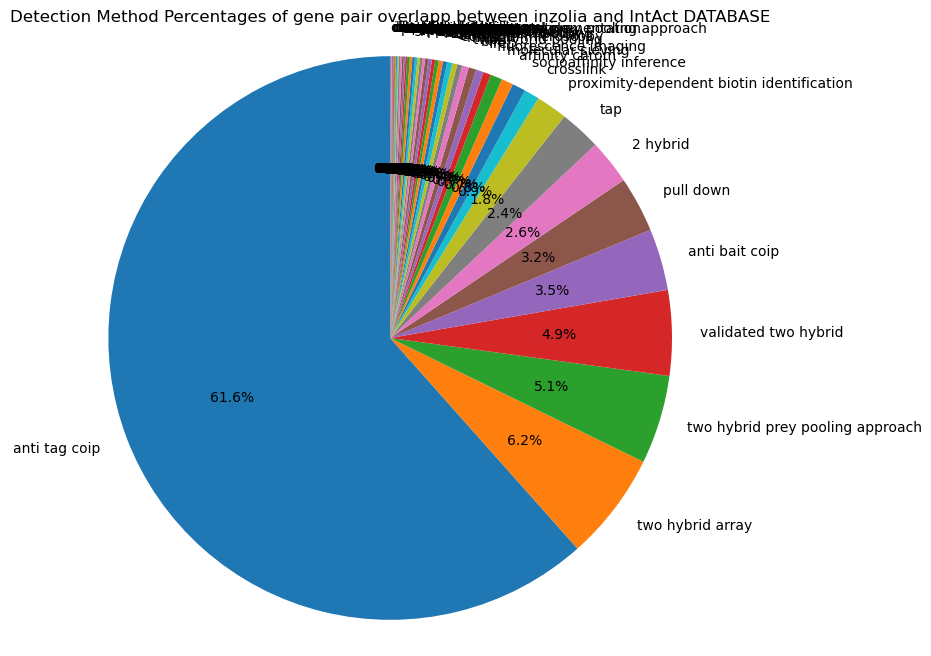

In [119]:
import pandas as pd
import matplotlib.pyplot as plt

# Count occurrences of each detection method
method_counts = interaction_results['detectionMethod'].value_counts()

# Calculate percentages
method_percentages = method_counts / method_counts.sum() * 100

# Plot pie chart
plt.figure(figsize=(8, 8))
plt.pie(method_percentages, labels=method_percentages.index, autopct='%1.1f%%', startangle=90)
plt.title('Detection Method Percentages of gene pair overlapp between inzolia and IntAct DATABASE')
plt.axis('equal')  
plt.show()

# Remove these label methods below 0.8 for improve visualisation of the data

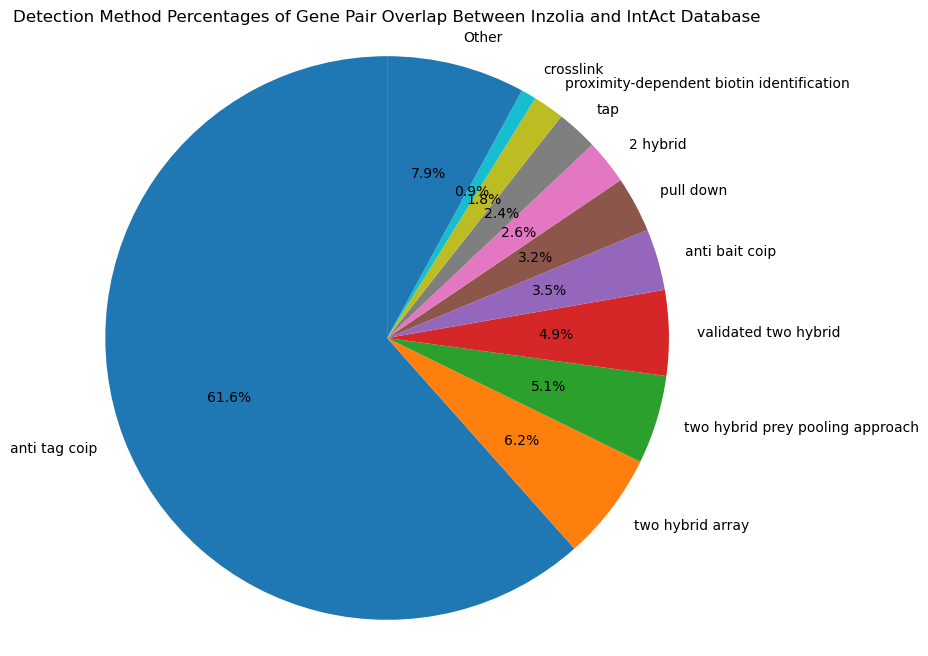

In [130]:
import pandas as pd
import matplotlib.pyplot as plt

# Count occurrences of each detection method
method_counts = interaction_results['detectionMethod'].value_counts()

# Calculate percentages
method_percentages = method_counts / method_counts.sum() * 100

# Filter out methods with percentage below 0.8
filtered_method_percentages = method_percentages[method_percentages >= 0.8]

# Create a new "Other" category for the smaller methods
other_method_percentage = method_percentages[method_percentages < 0.8].sum()
if other_method_percentage > 0:
    # Use pd.concat to append the "Other" category
    filtered_method_percentages = pd.concat([filtered_method_percentages, pd.Series([other_method_percentage], index=['Other'])])

# Plot pie chart
plt.figure(figsize=(8, 8))
plt.pie(filtered_method_percentages, labels=filtered_method_percentages.index, autopct='%1.1f%%', startangle=90)
plt.title('Detection Method Percentages of Gene Pair Overlap Between Inzolia and IntAct Database')
plt.axis('equal')  
plt.show()


# Remove the duplicate
One gene pairs can be detected in diffrents methods 


In [116]:
# Step 1: Create a copy of the DataFrame to avoid modifying the original
interaction_results_copy = interaction_results

# Step 2: Create a new column that stores the gene pair in a consistent order (alphabetically)
interaction_results_copy['GenePair'] = interaction_results_copy.apply(
    lambda row: tuple(sorted([row['Gene1'], row['Gene2']])), axis=1
)

# Step 3: Remove duplicates based on the 'GenePair' column
interaction_results_copy = interaction_results_copy.drop_duplicates(subset=['GenePair'])

# Step 4: Drop the helper 'GenePair' column
interaction_results_copy = interaction_results_copy.drop(columns=['GenePair'])

# Print the cleaned DataFrame (modified copy)
print(interaction_results_copy)



        Gene1    Gene2       detectionMethod intraspeciesInteraction
0     METTL2A  METTL2B         anti tag coip            Homo sapiens
1      TUBA1B   TUBA1C         anti tag coip            Homo sapiens
2      FAHD2A   FAHD2B         anti tag coip            Homo sapiens
5      ZNF587   ZNF417  validated two hybrid            Homo sapiens
8       MAGOH   MAGOHB         anti tag coip            Homo sapiens
...       ...      ...                   ...                     ...
2056  SLC26A6  SLC26A2         anti tag coip            Homo sapiens
2057   ERGIC1   ERGIC3  fluorescence imaging            Homo sapiens
2061     HSF4     HSF2         anti tag coip            Homo sapiens
2062    CEBPD    CEBPB         peptide array            Homo sapiens
2063   ZBTB26   ZBTB12  validated two hybrid            Homo sapiens

[796 rows x 4 columns]


# Clean and arange the data extracted from intAKT so it will be ready for compartion 

In [157]:
# Create the 'ReagentID' column by sorting Gene1 and Gene2 alphabetically and joining them
interaction_results_copy['ReagentID'] = interaction_results_copy.apply(
    lambda row: '_'.join(sorted([row['Gene1'], row['Gene2']])), axis=1
)

# Return a DataFrame with only the 'Gene1', 'Gene2', 'ReagentID', 'detectionMethod', and 'intraspeciesInteraction' columns
intAkt_df = interaction_results_copy[['Gene1', 'Gene2', 'ReagentID', 'detectionMethod', 'intraspeciesInteraction']]

intAkt_df

,Gene1,Gene2,ReagentID,detectionMethod,intraspeciesInteraction
0,METTL2A,METTL2B,METTL2A_METTL2B,anti tag coip,Homo sapiens
1,TUBA1B,TUBA1C,TUBA1B_TUBA1C,anti tag coip,Homo sapiens
2,FAHD2A,FAHD2B,FAHD2A_FAHD2B,anti tag coip,Homo sapiens
5,ZNF587,ZNF417,ZNF417_ZNF587,validated two hybrid,Homo sapiens
8,MAGOH,MAGOHB,MAGOH_MAGOHB,anti tag coip,Homo sapiens
...,...,...,...,...,...
2056,SLC26A6,SLC26A2,SLC26A2_SLC26A6,anti tag coip,Homo sapiens
2057,ERGIC1,ERGIC3,ERGIC1_ERGIC3,fluorescence imaging,Homo sapiens
2061,HSF4,HSF2,HSF2_HSF4,anti tag coip,Homo sapiens
2062,CEBPD,CEBPB,CEBPB_CEBPD,peptide array,Homo sapiens


# Save the intreactions results 

In [131]:
# Save the interaction_results DataFrame to a text file (tab-separated values)
interaction_results_copy.to_csv('interaction_results_intAKT without dublcate.txt', sep='\t', index=False)

# Label inzolia libraly GI if they are expremintally evidance GI, otherwise no GI


In [172]:
# Create a copy of SynLethDB_label to label the interactions
df_inz_SynLethDB_IntAkt_label = SynLethDB_label.copy()

# Create a label for rows in df_inz_SynLethDB_IntAkt_label that overlap with intAkt_df based on 'ReagentID'
df_inz_SynLethDB_IntAkt_label['intAkt_labeled'] = df_inz_SynLethDB_IntAkt_label.apply(
    lambda row: 'GI' if row['ReagentID'] in intAkt_df['ReagentID'].values else 'no GI', axis=1
)

# Extract rows where 'intAkt_labeled' is 'GI' to verify the result
extracted_gi = df_inz_SynLethDB_IntAkt_label[df_inz_SynLethDB_IntAkt_label['intAkt_labeled'] == 'GI']
extracted_gi


,Gene1,Gene2,ReagentID,SynLethDB_labeled,intAkt_labeled
10,METTL2A,METTL2B,METTL2A_METTL2B,no GI,GI
20,TUBA1B,TUBA1C,TUBA1B_TUBA1C,no GI,GI
24,FAHD2A,FAHD2B,FAHD2A_FAHD2B,no GI,GI
26,ZNF417,ZNF587,ZNF417_ZNF587,no GI,GI
28,MAGOH,MAGOHB,MAGOH_MAGOHB,no GI,GI
...,...,...,...,...,...
8616,SLC26A2,SLC26A6,SLC26A2_SLC26A6,no GI,GI
8628,ERGIC1,ERGIC3,ERGIC1_ERGIC3,no GI,GI
8666,HSF2,HSF4,HSF2_HSF4,no GI,GI
8722,CEBPB,CEBPD,CEBPB_CEBPD,no GI,GI


# Venn diagram compartion between SynLethDB_labeled andintAkt_labeled

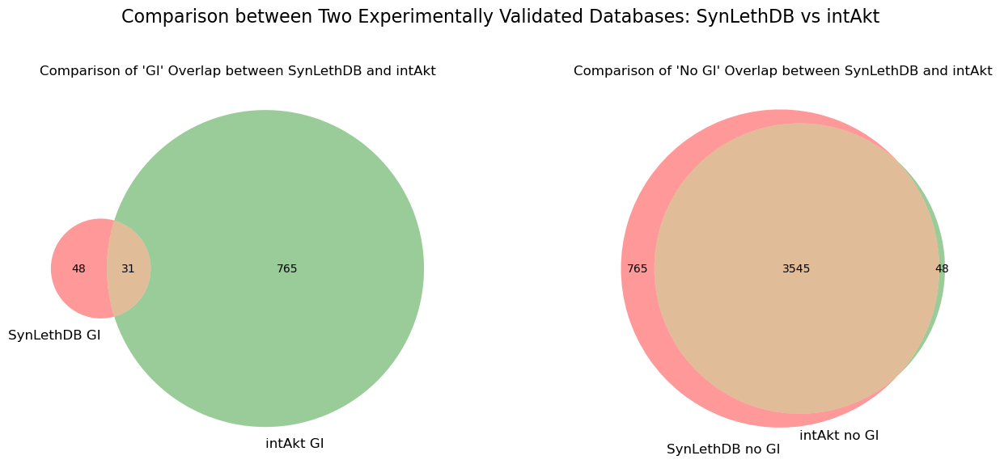

In [177]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

# Define sets for "GI" labels in each label category
set_synlethdb_gi = set(df_inz_SynLethDB_IntAkt_label[df_inz_SynLethDB_IntAkt_label['SynLethDB_labeled'] == 'GI'].index)
set_intakt_gi = set(df_inz_SynLethDB_IntAkt_label[df_inz_SynLethDB_IntAkt_label['intAkt_labeled'] == 'GI'].index)

# Define sets for "No GI" labels in each label category
set_synlethdb_no_gi = set(df_inz_SynLethDB_IntAkt_label[df_inz_SynLethDB_IntAkt_label['SynLethDB_labeled'] == 'no GI'].index)
set_intakt_no_gi = set(df_inz_SynLethDB_IntAkt_label[df_inz_SynLethDB_IntAkt_label['intAkt_labeled'] == 'no GI'].index)

# Plot side-by-side Venn diagrams for "GI" and "No GI"
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Venn diagram for "GI" labels
plt.sca(axes[0])  # Select the first subplot
venn2([set_synlethdb_gi, set_intakt_gi], ('SynLethDB GI', 'intAkt GI'))
axes[0].set_title("Comparison of 'GI' Overlap between SynLethDB and intAkt")

# Venn diagram for "No GI" labels
plt.sca(axes[1])  # Select the second subplot
venn2([set_synlethdb_no_gi, set_intakt_no_gi], ('SynLethDB no GI', 'intAkt no GI'))
axes[1].set_title("Comparison of 'No GI' Overlap between SynLethDB and intAkt")

# Show the plot with a main title
fig.suptitle("Comparison between Two Experimentally Validated Databases: SynLethDB vs intAkt", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make space for the main title
plt.show()


#  Expremintally labeled  GI if at least one of data base showed GI

In [200]:
# Create a new DataFrame as a copy of the original DataFrame
df_experiment_labeled = df_inz_SynLethDB_IntAkt_label.copy()

# Create a new column 'experiment_labeled' based on conditions
df_experiment_labeled['Class_label_exp'] = df_experiment_labeled.apply(
    lambda row: 'GI' if row['SynLethDB_labeled'] == 'GI' or row['intAkt_labeled'] == 'GI' else 'no GI', 
    axis=1
)
df_experiment_labeled

# Rename the 'ReagentID' column to 'Gene_combination'
df_experiment_labeled = df_experiment_labeled.rename(columns={'ReagentID': 'Gene_combination'})
df_experiment_labeled



,Gene1,Gene2,Gene_combination,SynLethDB_labeled,intAkt_labeled,Class_label_exp
0,ACTB,ACTG1,ACTB_ACTG1,no GI,no GI,no GI
2,EOLA1,EOLA2,EOLA1_EOLA2,no GI,no GI,no GI
4,RABL2A,RABL2B,RABL2A_RABL2B,no GI,no GI,no GI
6,RPL26,RPL26L1,RPL26_RPL26L1,no GI,no GI,no GI
8,CDK11A,CDK11B,CDK11A_CDK11B,GI,no GI,GI
...,...,...,...,...,...,...
8768,ZNF26,ZNF789,ZNF26_ZNF789,no GI,no GI,no GI
8770,ZNF227,ZNF514,ZNF227_ZNF514,no GI,no GI,no GI
8772,ZBTB12,ZBTB26,ZBTB12_ZBTB26,no GI,GI,GI
8774,ZNF41,ZNF517,ZNF41_ZNF517,no GI,no GI,no GI


# Save expremintally labeled  GI in a file

In [181]:
# Save the interaction_results DataFrame to a text file (tab-separated values)
df_experiment_labeled.to_csv(' expremintally labeled  GI .txt', sep='\t', index=False)

# open other labeled methods file 

In [185]:
file_path_corr_dep = "/home/user/Desktop/2024_08_27/master-project2/ dep_corr_labeled_GI.txt"
df_corr_dep_values  = pd.read_csv(file_path_corr_dep , sep='\t')
df_corr_dep_values 

,Gene_combination,cell_line,condition,Class_label_sum,Correlation_dep,Class_label_dep,Label_Agreement,Correlation_corr,Class_label_corr
0,AAK1_BMP2K,A375,2CP,no GI,-0.013799,no GI,Agree,0.159615,no GI
1,AAK1_BMP2K,A375,2CP,no GI,-0.013799,no GI,Agree,0.159615,no GI
2,AARS1_AARS2,A375,2CP,lol,0.002442,no GI,Disagree,0.132821,no GI
3,AARS1_AARS2,A375,2CP,lol,0.002442,no GI,Disagree,0.132821,no GI
4,ABCA2_ABCA3,A375,2CP,no GI,0.058724,no GI,Agree,0.326935,no GI
...,...,...,...,...,...,...,...,...,...
17396,ZSCAN31_ZSCAN9,Meljuso,2CP sel,no GI,0.037240,no GI,Agree,0.196111,no GI
17397,ZSWIM4_ZSWIM6,Meljuso,2CP sel,no GI,0.031158,no GI,Agree,0.281455,no GI
17398,ZSWIM4_ZSWIM6,Meljuso,2CP sel,no GI,0.031158,no GI,Agree,0.281455,no GI
17399,ZXDB_ZXDC,Meljuso,2CP sel,no GI,-0.049997,no GI,Agree,0.322427,no GI


# Merge expremintally validated label with other label

In [205]:
# Merge the DataFrames on 'Gene_combination' column using a left join
df_corr_dep_exp_values = pd.merge(
    df_corr_dep_values,
    df_experiment_labeled[['Gene_combination', 'Class_label_exp']],  # Ensure 'Gene_combination' is included in the merge
    on='Gene_combination',
    how='left'
)
df_corr_dep_exp_values

# Save the interaction_results DataFrame to a text file (tab-separated values)
df_corr_dep_exp_values.to_csv('df_corr_dep_exp_labeled.txt', sep='\t', index=False)

# Comparison Between 'Class_label_sum' and 'Class_label_exp' for 'GI' and 'No GI' Labels"

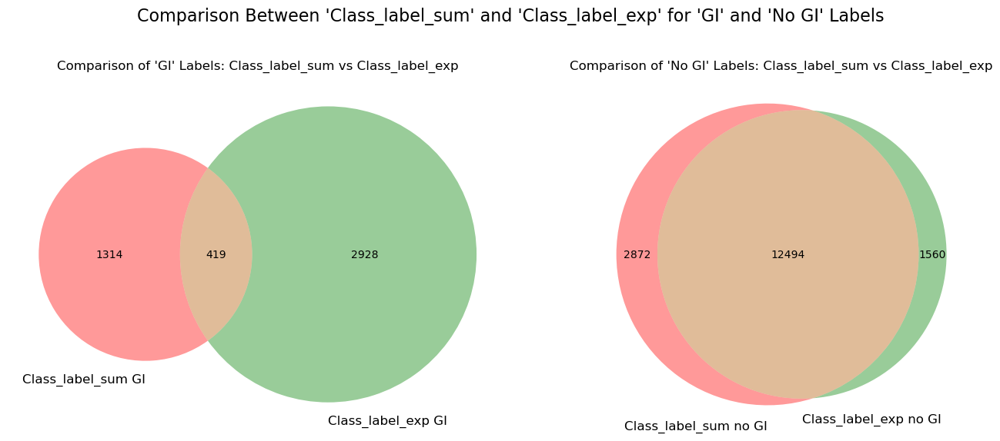

In [196]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

# Define sets for "GI" labels in each category ('Class_label_sum' and 'Class_label_exp')
set_class_label_sum_gi = set(df_corr_dep_exp_values[df_corr_dep_exp_values['Class_label_sum'] == 'GI'].index)
set_class_label_exp_gi = set(df_corr_dep_exp_values[df_corr_dep_exp_values['Class_label_exp'] == 'GI'].index)

# Define sets for "No GI" labels in each category ('Class_label_sum' and 'Class_label_exp')
set_class_label_sum_no_gi = set(df_corr_dep_exp_values[df_corr_dep_exp_values['Class_label_sum'] == 'no GI'].index)
set_class_label_exp_no_gi = set(df_corr_dep_exp_values[df_corr_dep_exp_values['Class_label_exp'] == 'no GI'].index)

# Plot side-by-side Venn diagrams for "GI" and "No GI"
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Venn diagram for "GI" labels (overlap between 'Class_label_sum' and 'Class_label_exp')
plt.sca(axes[0])  # Select the first subplot
venn2([set_class_label_sum_gi, set_class_label_exp_gi], ('Class_label_sum GI', 'Class_label_exp GI'))
axes[0].set_title("Comparison of 'GI' Labels: Class_label_sum vs Class_label_exp")

# Venn diagram for "No GI" labels (overlap between 'Class_label_sum' and 'Class_label_exp')
plt.sca(axes[1])  # Select the second subplot
venn2([set_class_label_sum_no_gi, set_class_label_exp_no_gi], ('Class_label_sum no GI', 'Class_label_exp no GI'))
axes[1].set_title("Comparison of 'No GI' Labels: Class_label_sum vs Class_label_exp")

# Show the plot with a main title
fig.suptitle("Comparison Between 'Class_label_sum' and 'Class_label_exp' for 'GI' and 'No GI' Labels", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make space for the main title
plt.show()




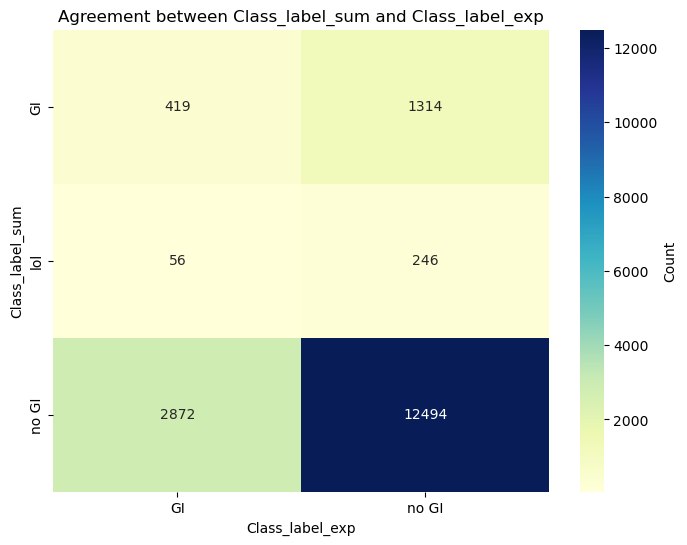

In [203]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count the number of agreements and disagreements per class
agreement_summary = df_corr_dep_exp_values.groupby(['Class_label_sum', 'Class_label_exp']).size().reset_index(name='Count')

# Pivot the DataFrame for a heatmap
heatmap_data = agreement_summary.pivot(index="Class_label_sum", columns="Class_label_exp", values="Count")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data, annot=True, fmt="d", cmap="YlGnBu", cbar_kws={'label': 'Count'})
plt.title("Agreement between Class_label_sum and Class_label_exp")
plt.xlabel("Class_label_exp")
plt.ylabel("Class_label_sum")
plt.show()


# Comparison Between 'Class_label_dep' and 'Class_label_exp' for 'GI' and 'No GI' Labels

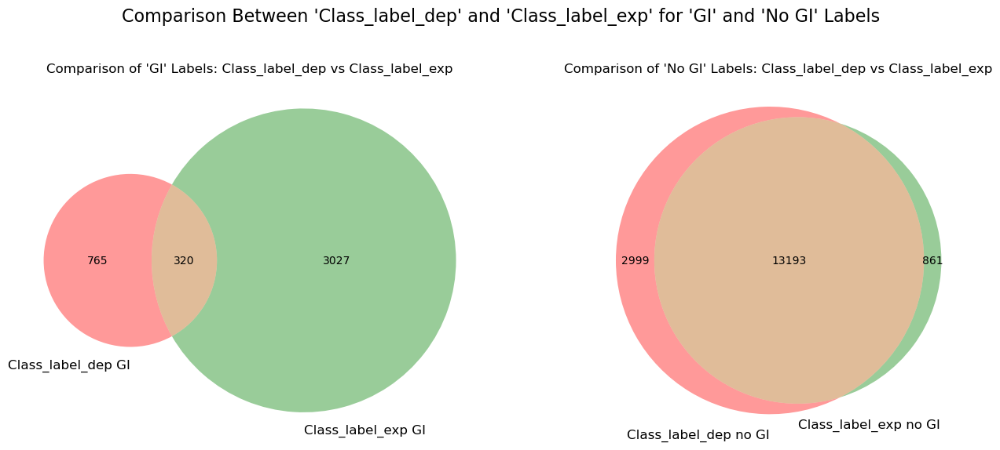

In [197]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

# Define sets for "GI" labels in each category ('Class_label_dep' and 'Class_label_exp')
set_class_label_dep_gi = set(df_corr_dep_exp_values[df_corr_dep_exp_values['Class_label_dep'] == 'GI'].index)
set_class_label_exp_gi = set(df_corr_dep_exp_values[df_corr_dep_exp_values['Class_label_exp'] == 'GI'].index)

# Define sets for "No GI" labels in each category ('Class_label_dep' and 'Class_label_exp')
set_class_label_dep_no_gi = set(df_corr_dep_exp_values[df_corr_dep_exp_values['Class_label_dep'] == 'no GI'].index)
set_class_label_exp_no_gi = set(df_corr_dep_exp_values[df_corr_dep_exp_values['Class_label_exp'] == 'no GI'].index)

# Plot side-by-side Venn diagrams for "GI" and "No GI"
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Venn diagram for "GI" labels (overlap between 'Class_label_dep' and 'Class_label_exp')
plt.sca(axes[0])  # Select the first subplot
venn2([set_class_label_dep_gi, set_class_label_exp_gi], ('Class_label_dep GI', 'Class_label_exp GI'))
axes[0].set_title("Comparison of 'GI' Labels: Class_label_dep vs Class_label_exp")

# Venn diagram for "No GI" labels (overlap between 'Class_label_dep' and 'Class_label_exp')
plt.sca(axes[1])  # Select the second subplot
venn2([set_class_label_dep_no_gi, set_class_label_exp_no_gi], ('Class_label_dep no GI', 'Class_label_exp no GI'))
axes[1].set_title("Comparison of 'No GI' Labels: Class_label_dep vs Class_label_exp")

# Show the plot with a main title
fig.suptitle("Comparison Between 'Class_label_dep' and 'Class_label_exp' for 'GI' and 'No GI' Labels", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  
plt.show()


# compartion between 'Class_label_corr' and 'Class_label_exp' for 'GI' and 'No GI' Labels"

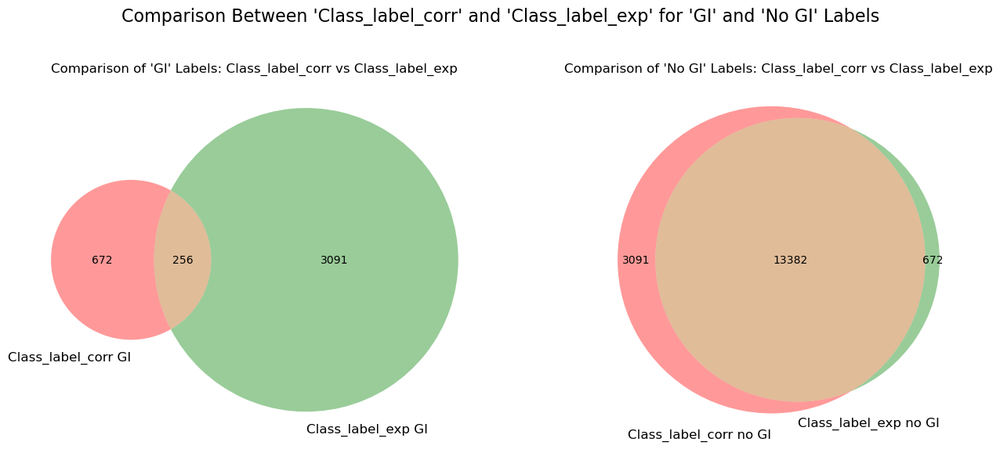

In [199]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

# Define sets for "GI" labels in each category ('Class_label_corr' and 'Class_label_exp')
set_class_label_corr_gi = set(df_corr_dep_exp_values[df_corr_dep_exp_values['Class_label_corr'] == 'GI'].index)
set_class_label_exp_gi = set(df_corr_dep_exp_values[df_corr_dep_exp_values['Class_label_exp'] == 'GI'].index)

# Define sets for "No GI" labels in each category ('Class_label_corr' and 'Class_label_exp')
set_class_label_corr_no_gi = set(df_corr_dep_exp_values[df_corr_dep_exp_values['Class_label_corr'] == 'no GI'].index)
set_class_label_exp_no_gi = set(df_corr_dep_exp_values[df_corr_dep_exp_values['Class_label_exp'] == 'no GI'].index)

# Plot side-by-side Venn diagrams for "GI" and "No GI"
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Venn diagram for "GI" labels (overlap between 'Class_label_corr' and 'Class_label_exp')
plt.sca(axes[0])  # Select the first subplot
venn2([set_class_label_corr_gi, set_class_label_exp_gi], ('Class_label_corr GI', 'Class_label_exp GI'))
axes[0].set_title("Comparison of 'GI' Labels: Class_label_corr vs Class_label_exp")

# Venn diagram for "No GI" labels (overlap between 'Class_label_corr' and 'Class_label_exp')
plt.sca(axes[1])  # Select the second subplot
venn2([set_class_label_corr_no_gi, set_class_label_exp_no_gi], ('Class_label_corr no GI', 'Class_label_exp no GI'))
axes[1].set_title("Comparison of 'No GI' Labels: Class_label_corr vs Class_label_exp")

# Show the plot with a main title
fig.suptitle("Comparison Between 'Class_label_corr' and 'Class_label_exp' for 'GI' and 'No GI' Labels", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make space for the main title
plt.show()
